<a href="https://colab.research.google.com/github/Jucamilocar08/Proyecto_IA/blob/main/Proyecto_Entregable.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Importación de datos




In [5]:
!wget --no-cache -O init.py -q https://raw.githubusercontent.com/rramosp/ai4eng.v1/main/content/init.py
import init; init.init(force_download=False); init.get_weblink()
init.endpoint

replicating local resources


'https://m5knaekxo6.execute-api.us-west-2.amazonaws.com/dev-v0001/rlxmooc'

In [6]:
import numpy as np
import pandas as pd
import seaborn as sns
import gdown
import math
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from local.lib import mlutils
from IPython.display import Image
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn import svm
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import ComplementNB
from sklearn.naive_bayes import MultinomialNB
import plotly.express as px

!gdown https://drive.google.com/uc?id=1YtvXZ5JVFz-R2FG2BkdSUd98T83qLhMg

Downloading...
From: https://drive.google.com/uc?id=1YtvXZ5JVFz-R2FG2BkdSUd98T83qLhMg
To: /content/weatherAUS.csv
100% 14.2M/14.2M [00:00<00:00, 137MB/s]


In [7]:
# Lectura de DataFrame y Cambio de index
df = pd.read_csv("weatherAUS.csv", sep=";")
df.index = pd.to_datetime(df['Date'], format='%d/%m/%Y') # %H:%M')
del(df["Location"])

#Visualizacion de datos y relleno de datos faltantes

In [8]:
# Informacion del dataset antes de iniciar, con el relleno de datos faltantes
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Date,145460,3436,12/11/2013,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MinTemp,143975.0,NaN,NaN,NaN,12.194034,6.398495,-8.5,7.6,12.0,16.9,33.9
MaxTemp,144199.0,NaN,NaN,NaN,23.221348,7.119049,-4.8,17.9,22.6,28.2,48.1
Rainfall,142199.0,NaN,NaN,NaN,2.360918,8.47806,0.0,0.0,0.0,0.8,371.0
Evaporation,82670.0,NaN,NaN,NaN,5.468232,4.193704,0.0,2.6,4.8,7.4,145.0
Sunshine,75625.0,NaN,NaN,NaN,7.611178,3.785483,0.0,4.8,8.4,10.6,14.5
WindGustDir,135134,16,W,9915,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindGustSpeed,135197.0,NaN,NaN,NaN,40.03523,13.607062,6.0,31.0,39.0,48.0,135.0
WindDir9am,134894,16,N,11758,NaN,NaN,NaN,NaN,NaN,NaN,NaN
WindDir3pm,141232,16,SE,10838,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145460 entries, 2008-12-01 to 2017-06-25
Data columns (total 22 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  object 
 1   MinTemp        143975 non-null  float64
 2   MaxTemp        144199 non-null  float64
 3   Rainfall       142199 non-null  float64
 4   Evaporation    82670 non-null   float64
 5   Sunshine       75625 non-null   float64
 6   WindGustDir    135134 non-null  object 
 7   WindGustSpeed  135197 non-null  float64
 8   WindDir9am     134894 non-null  object 
 9   WindDir3pm     141232 non-null  object 
 10  WindSpeed9am   143693 non-null  float64
 11  WindSpeed3pm   142398 non-null  float64
 12  Humidity9am    142806 non-null  float64
 13  Humidity3pm    140953 non-null  float64
 14  Pressure9am    130395 non-null  float64
 15  Pressure3pm    130432 non-null  float64
 16  Cloud9am       89572 non-null   float64
 17  Cloud3pm     

In [10]:
# Eliminar todas la filas de que contengan almenos un dato faltante
df = df.dropna()

In [11]:
# Paso de Columnas caltegoricas a Columas con datos numericos
diccionario = {
    'NW': '1',
    'ENE': '2',
    'SSE': '3',
    'SE': '4',
    'E': '5',
    'S': '6',
    'N': '7',
    'WNW': '8',
    'ESE': '9',
    'NE': '10',
    'NNE': '11',
    'NNW': '12',
    'SW': '13',
    'W': '14',
    'WSW': '15',
    'SSW': '16'
}
df = df.copy()

# Aplicar del diccionario a las tres columnas WindGustDir, WindDir9am y WindDir3am

df['WindGustDir'] = df[ 'WindDir3pm'].replace(diccionario)
df[ 'WindDir9am'] = df[ 'WindDir9am'].replace(diccionario)
df[ 'WindDir3pm'] = df[ 'WindDir3pm'].replace(diccionario)

# Categorizacion de las Columnas RainToday y RainTomorrow

df['RainToday']=df['RainToday'].replace(['No'] , '0')
df['RainToday']=df['RainToday'].replace(['Yes'] , '1')
df['RainTomorrow']=df['RainTomorrow'].replace(['No'] , '0')
df['RainTomorrow']=df['RainTomorrow'].replace(['Yes'] , '1')

df = df.apply(pd.to_numeric, errors='ignore')

In [12]:
# Informacion del dataset despues de rellenar los datos faltantes
df.describe(include='all').T
del(df["Date"])

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 56420 entries, 2009-01-01 to 2017-06-24
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MinTemp        56420 non-null  float64
 1   MaxTemp        56420 non-null  float64
 2   Rainfall       56420 non-null  float64
 3   Evaporation    56420 non-null  float64
 4   Sunshine       56420 non-null  float64
 5   WindGustDir    56420 non-null  int64  
 6   WindGustSpeed  56420 non-null  float64
 7   WindDir9am     56420 non-null  int64  
 8   WindDir3pm     56420 non-null  int64  
 9   WindSpeed9am   56420 non-null  float64
 10  WindSpeed3pm   56420 non-null  float64
 11  Humidity9am    56420 non-null  float64
 12  Humidity3pm    56420 non-null  float64
 13  Pressure9am    56420 non-null  float64
 14  Pressure3pm    56420 non-null  float64
 15  Cloud9am       56420 non-null  float64
 16  Cloud3pm       56420 non-null  float64
 17  Temp9am        56420 non-null  fl

#Visualizacion grafica de los datos


In [ ]:
#ESTA PARTE FALTA HACER LA CORRELACION DE COLUMNAS

<Figure size 2000x2000 with 0 Axes>

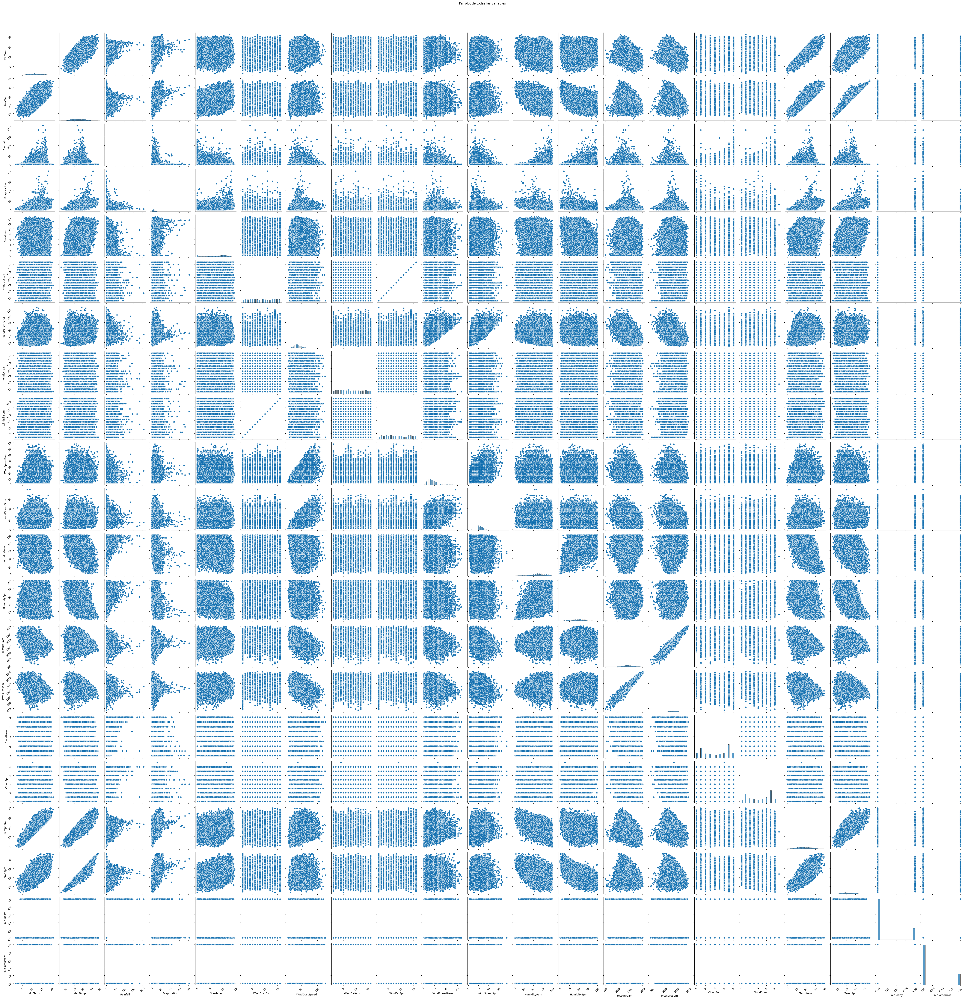

In [14]:
# Ajusta el tamaño de la figura
plt.figure(figsize=(20, 20))

# Crea un pairplot con todas las variables
sns.pairplot(df)

# Ajusta la posición del título principal para evitar superposición
plt.suptitle('Pairplot de todas las variables', y=1.02)

# Rotación de etiquetas en los ejes
for ax in plt.gcf().axes:
    plt.sca(ax)
    plt.xticks(rotation=45)
    plt.yticks(rotation=45)

# Muestra el gráfico
plt.show()


<Axes: >

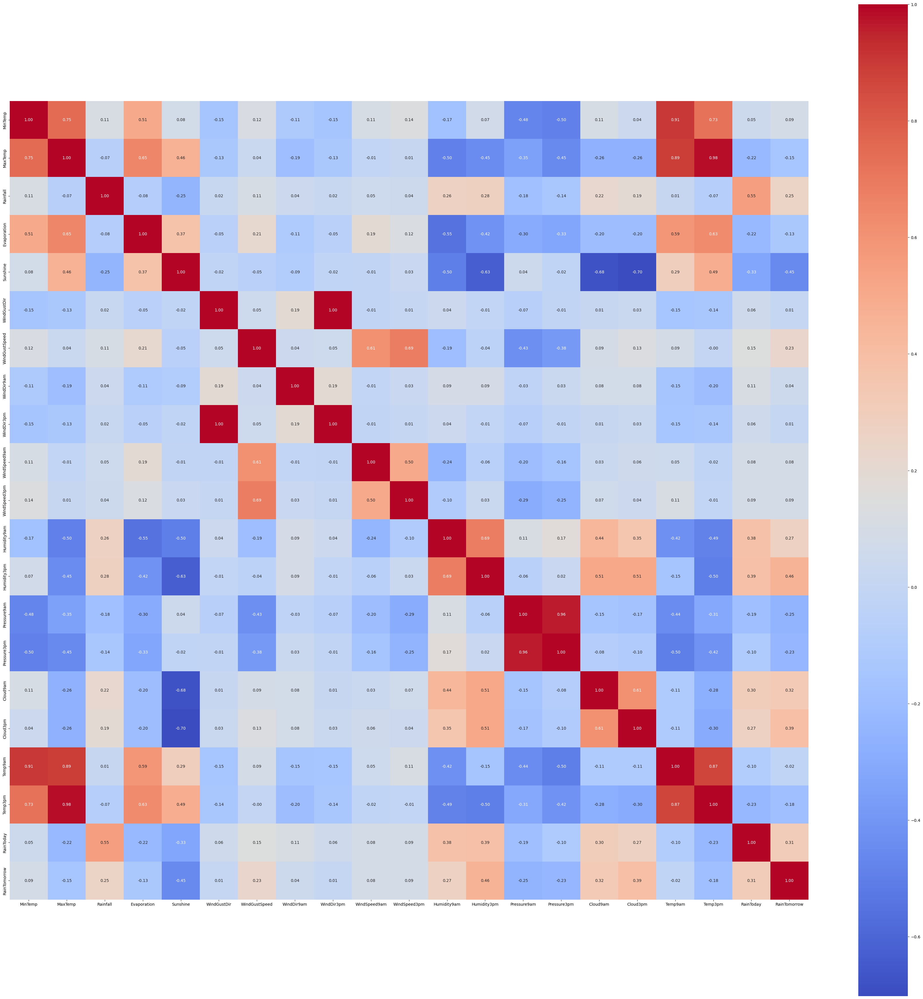

In [15]:
import seaborn as sns
#Matriz de correlación con todas las de la ley
## KEEPOUTPUT
#correlation matrix
corrmat = df.corr()
f, ax = plt.subplots(figsize=(45,45))
sns.heatmap(corrmat, vmax=1, square=True, annot=True, fmt='.2f', cmap='coolwarm', cbar=True)

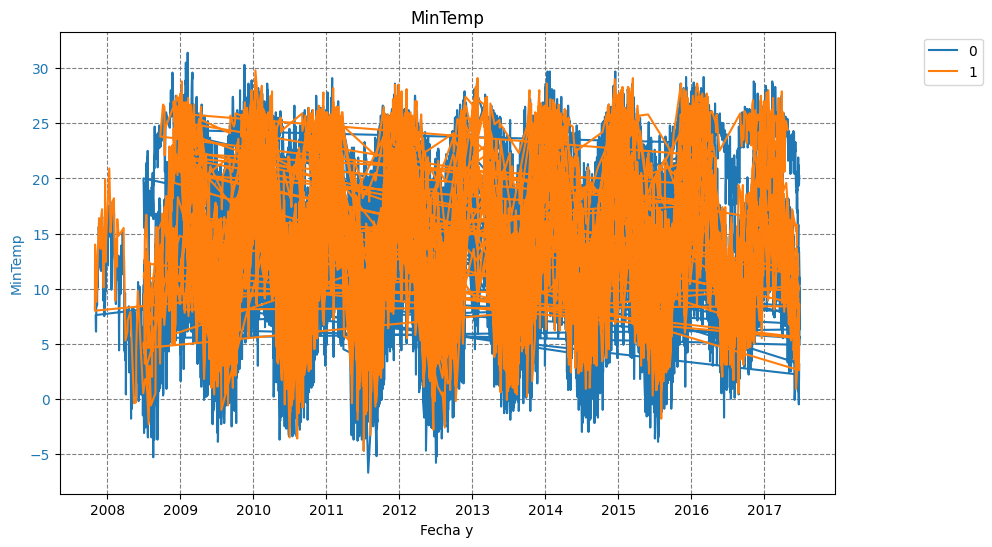

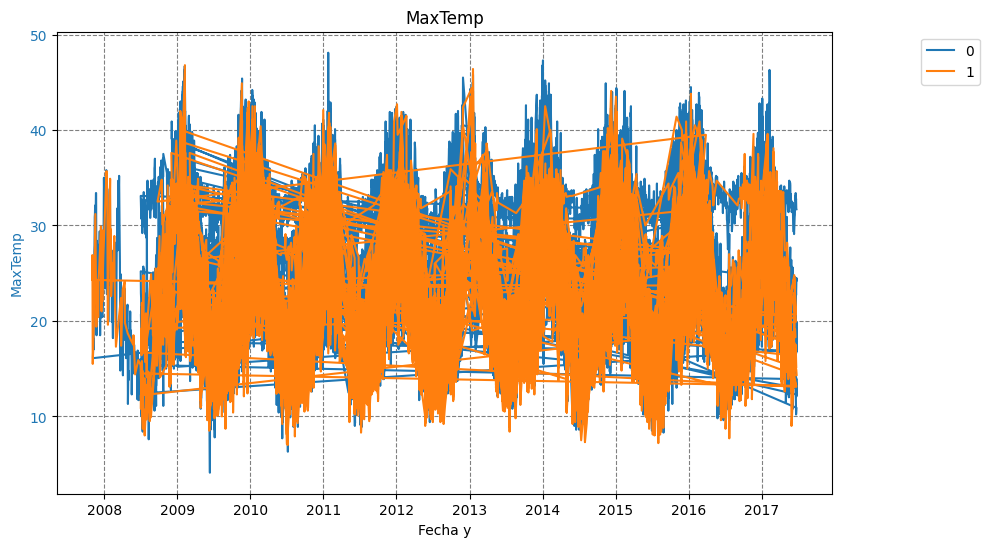

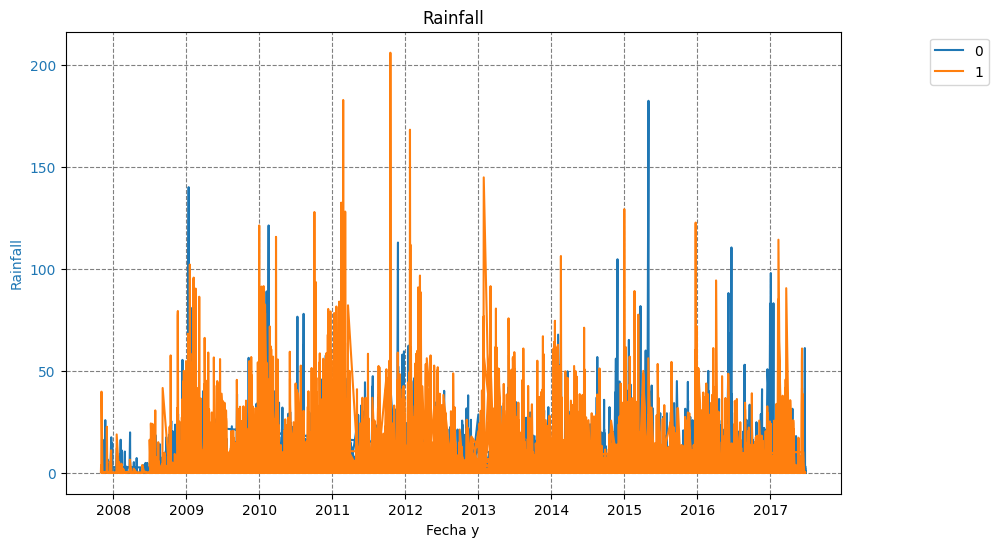

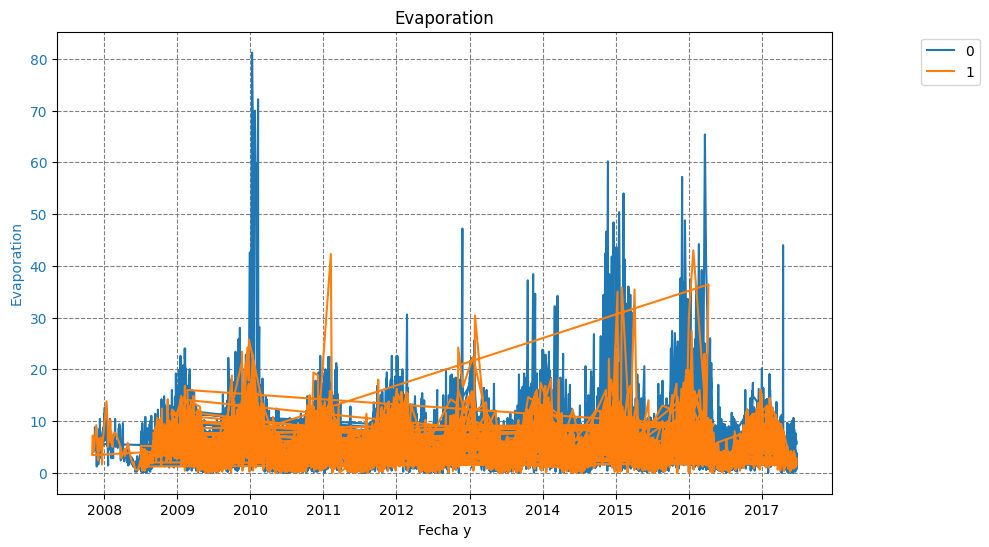

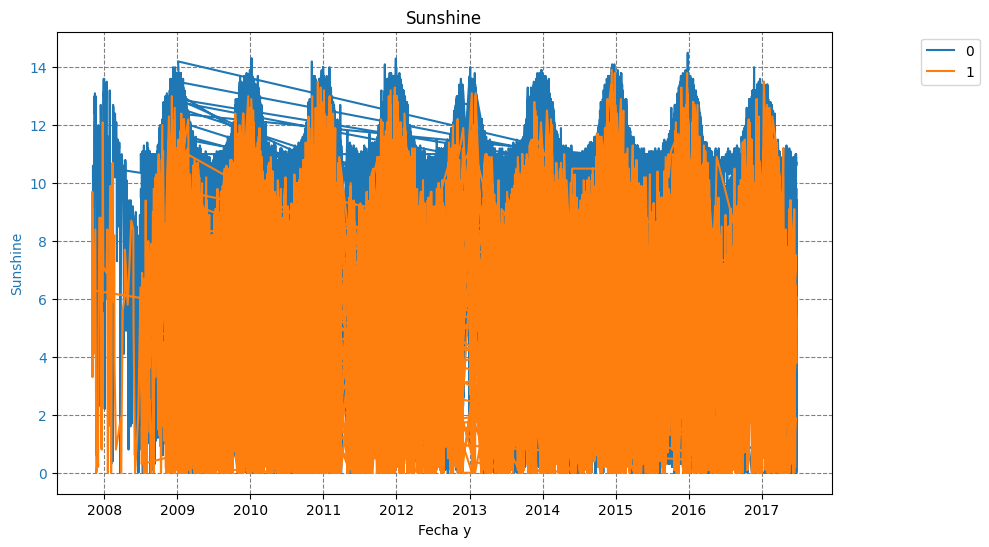

...

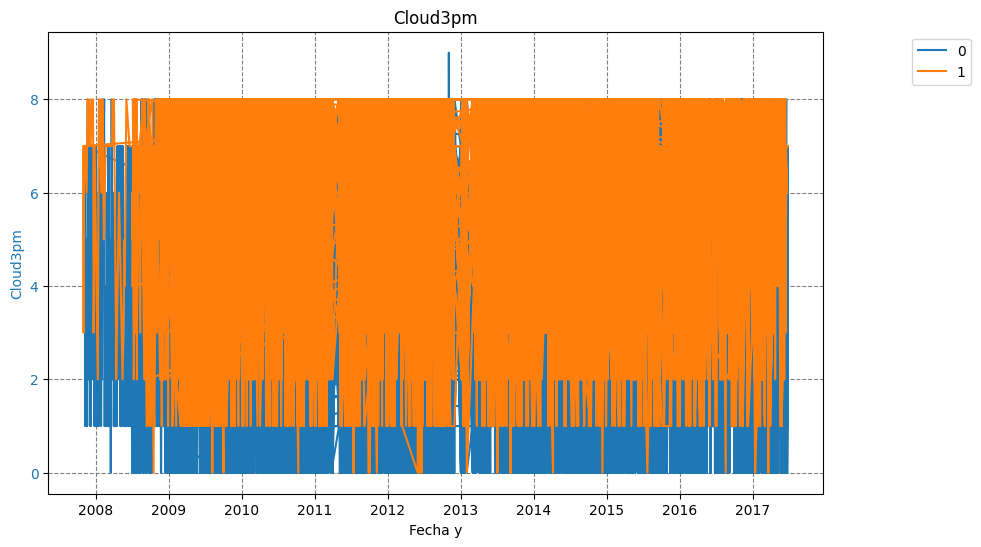

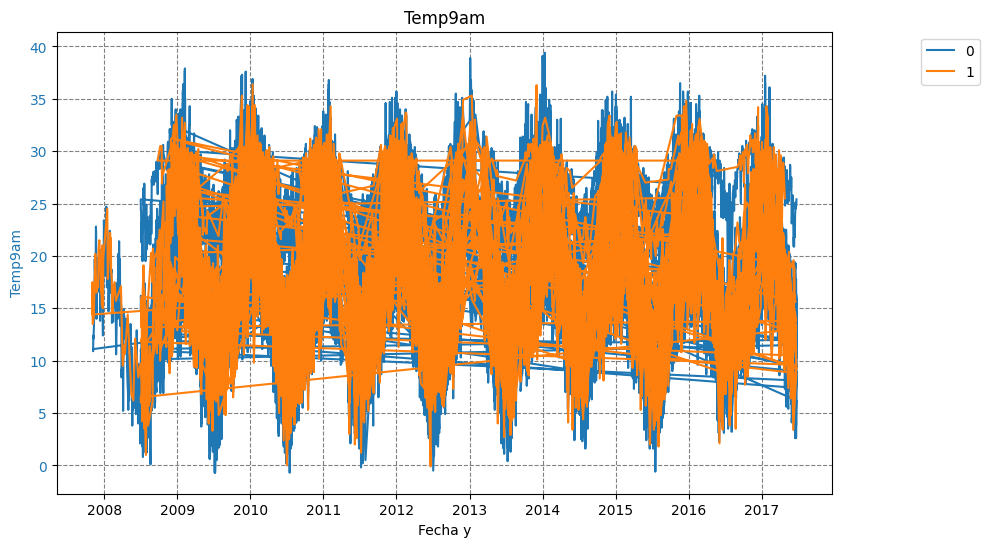

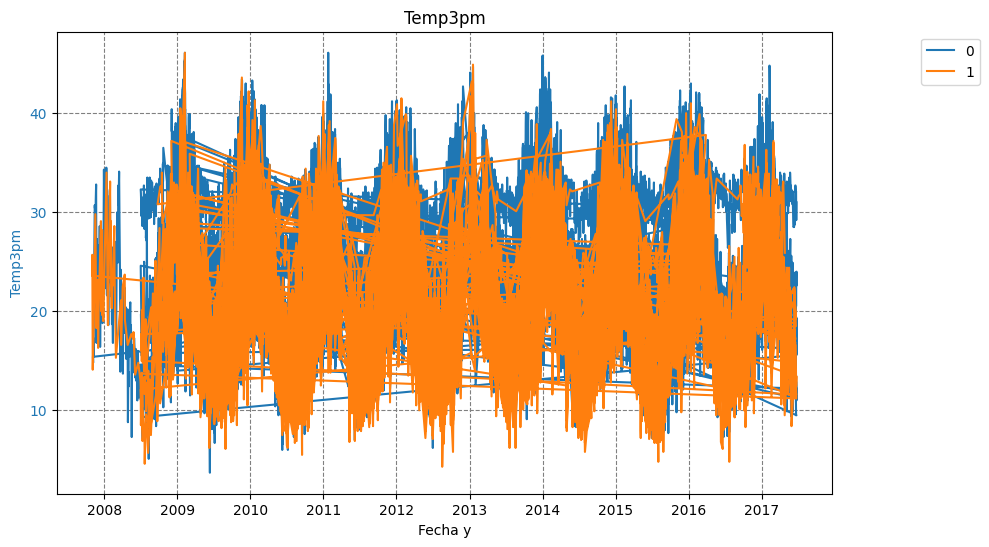

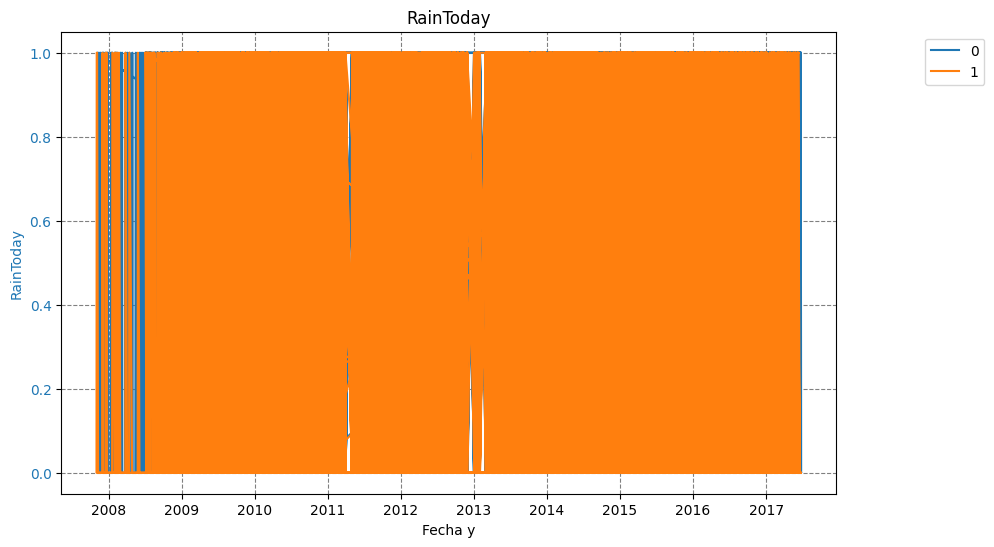

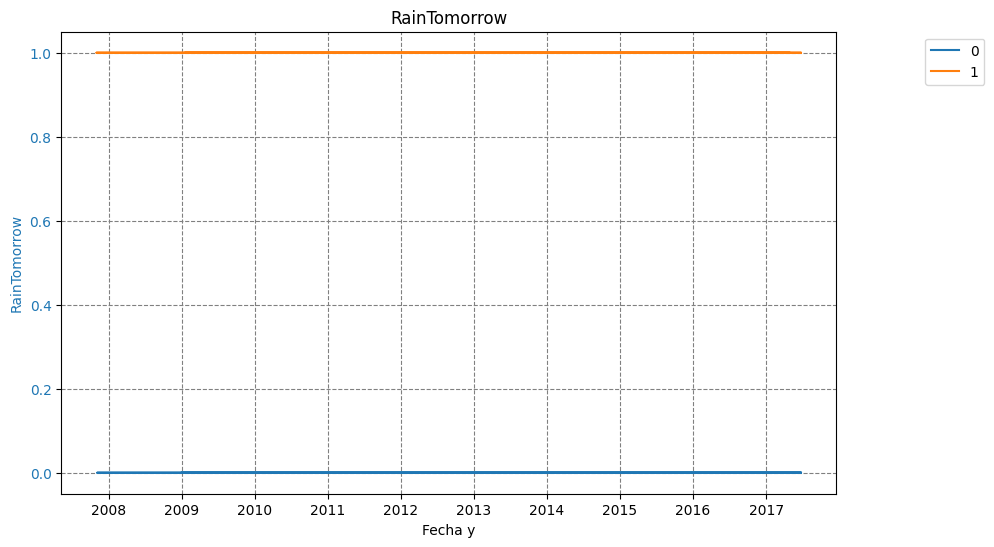

In [16]:
import matplotlib.pyplot as plt

# Agrupar los datos por RainTomorrow

grouped = df.groupby('RainTomorrow')


# Iterar sobre cada descriptor
for descriptor in df.columns[0:]:
    # Crear una figura y un conjunto de ejes
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.grid(True, linestyle='--', color='gray')

    # Iterar sobre cada segmento y graficar el descriptor correspondiente
    for RainTomorrow, data in grouped:
        ax.plot(data[descriptor], label=RainTomorrow)

    # Agregar leyenda y título
    ax.legend(loc='upper right', bbox_to_anchor=(1.2, 1))
    ax.set_xlabel('Fecha y')
    ax.set_ylabel(descriptor, color='tab:blue')
    ax.tick_params(axis='y', labelcolor='tab:blue')
    ax.set_title(descriptor)

    # Mostrar la gráfica
    plt.show()


# Modelo de predicción

In [ ]:
x = df.copy()  # Hacemos una copia del DataFrame
x.drop(['RainTomorrow'], axis=1, inplace=True)  # Eliminamos la columna de la variable dependiente
y = df['RainTomorrow']  # Variable dependiente

In [ ]:
x_train , x_test , y_train , y_test = train_test_split(x , y , test_size = 0.3 , random_state=0)
logreg=LogisticRegression(solver='newton-cg' , random_state=1 , verbose=1 ,n_jobs=-1 )
logreg.fit(x_train , y_train)
y_pred=logreg.predict(x_test)
print('Accuracy :' , metrics.accuracy_score(y_test , y_pred))

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Accuracy : 0.8561975658749852


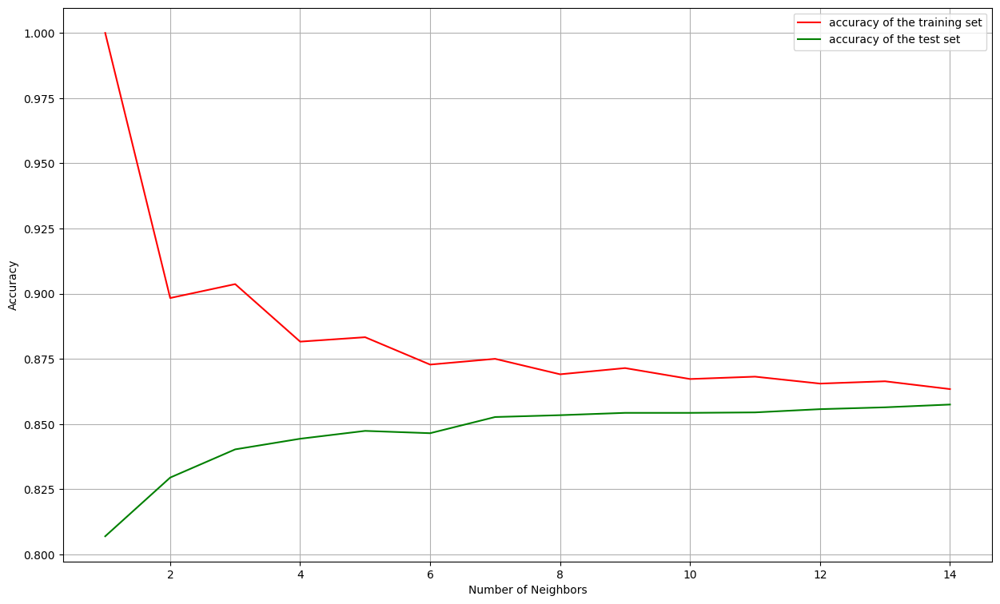

In [ ]:
training_acc = []
test_acc = []
# try knn for diffrent k nearst neighbor from 1 to 25
neighbors_setting = range(1 , 15)
for n_neighbors in neighbors_setting:
    Knn_model = KNeighborsClassifier(n_neighbors = n_neighbors)
    Knn_model.fit(x_train , y_train.ravel())
    training_acc.append(Knn_model.score(x_train , y_train))
    test_acc.append(Knn_model.score(x_test , y_test))


plt.figure(figsize=(15 , 9))
plt.plot(neighbors_setting , training_acc , label='accuracy of the training set' , color='red')
plt.plot(neighbors_setting , test_acc , label='accuracy of the test set' , color='green')
plt.ylabel('Accuracy')
plt.xlabel('Number of Neighbors')
plt.legend()
plt.grid()


In [ ]:
# logreg----> solver='liblinear'

non_numeric_columns = df.select_dtypes(exclude='number')
x = df.drop(['RainTomorrow'] , axis=1)

y = y.ravel()

def Logreg (x , y , Testsize ):
    df_e = pd.DataFrame()
    for j in Testsize:
        x_train , x_test , y_train , y_test = train_test_split(x , y , test_size=j , random_state=0)
        logreg = LogisticRegression( solver='liblinear'  , random_state=1)
        logreg.fit(x_train , y_train)
        y_pred=logreg.predict(x_test)
        data_dict = {'Test_size': j , 'accuracy': metrics.accuracy_score(y_test , y_pred)
                     , "score": logreg.score(x,y)}
        df_e = pd.concat([df_e, pd.DataFrame([data_dict])], ignore_index=True)

    return(df_e)

df_e = Logreg(x , y , [.1 , .15 , .2 , .25 , .3])
df_e

,Test_size,accuracy,score
0,0.10,0.859270,0.852428
1,0.15,0.856198,0.852800
2,0.20,0.857409,0.853066
3,0.25,0.855867,0.852978
4,0.30,0.853834,0.852871


In [ ]:
# logreg----> solver='sag'

import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

x = df.drop(['RainTomorrow'] , axis=1)

y = y.ravel()

def Logreg (x , y , Testsize ):
    df_e = pd.DataFrame()
    for j in Testsize:
        x_train , x_test , y_train , y_test = train_test_split(x , y , test_size=j , random_state=0)
        logreg = LogisticRegression( solver='sag'  , random_state=1)
        logreg.fit(x_train , y_train)
        y_pred=logreg.predict(x_test)
        data_dict = {'Test_size': j , 'accuracy': metrics.accuracy_score(y_test , y_pred)
                     , "score": logreg.score(x,y)}
        df_e = pd.concat([df_e, pd.DataFrame([data_dict])], ignore_index=True)

    return(df_e)

df_e = Logreg(x , y , [.1 , .15 , .2 , .25 , .3])
df_e

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_sag.py:350: ConvergenceWarning: The max_iter was reached which means the coef_ did not converge
  warnings.warn(


,Test_size,accuracy,score
0,0.10,0.855548,0.852517
1,0.15,0.854661,0.852535
2,0.20,0.856877,0.852588
3,0.25,0.855016,0.852393
4,0.30,0.853303,0.852481


In [ ]:
y_pred_proba = logreg.predict_proba(x_test)[ :: , 1]
fpr , tpr ,_ = metrics.roc_curve(y_test , y_pred_proba )
plt.plot(tpr , label='df' , color='red' )
plt.legend(loc=2)
plt.show()

NameError: ignored

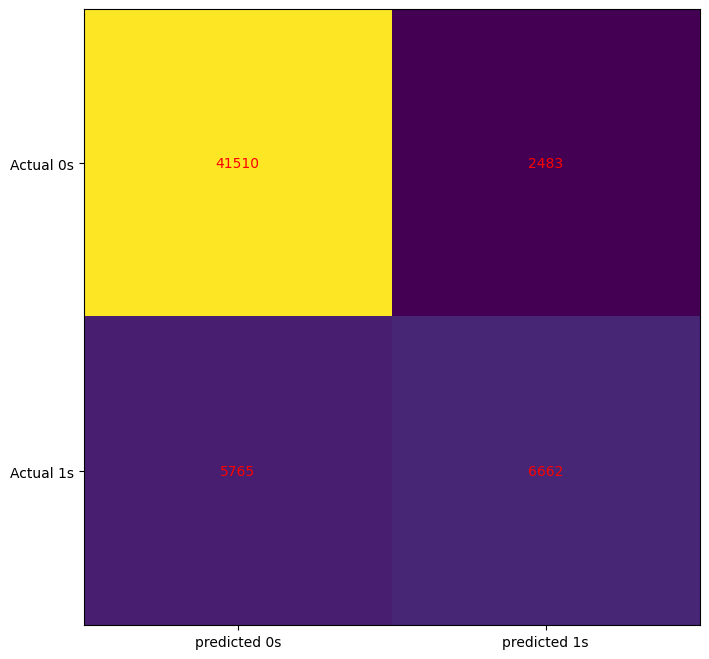

In [ ]:
cm = confusion_matrix(y , logreg.predict(x))
fig , ax = plt.subplots(figsize=(8,8))
ax.imshow(cm)
ax.grid(False)
ax.xaxis.set(ticks=(0,1) , ticklabels=('predicted 0s' , 'predicted 1s'))
ax.yaxis.set(ticks=(0,1) , ticklabels=('Actual 0s' , 'Actual 1s'))
ax.set_ylim(1.5 , -0.5)
for i in range(2):
    for j in range(2):
        ax.text(j ,i , cm[i,j] , ha='center' , va='center' , color='black')

plt.show()

